[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Shameer\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


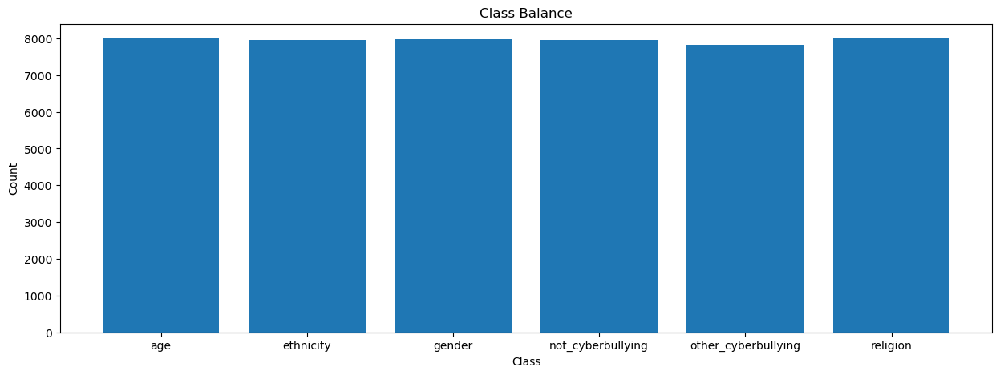

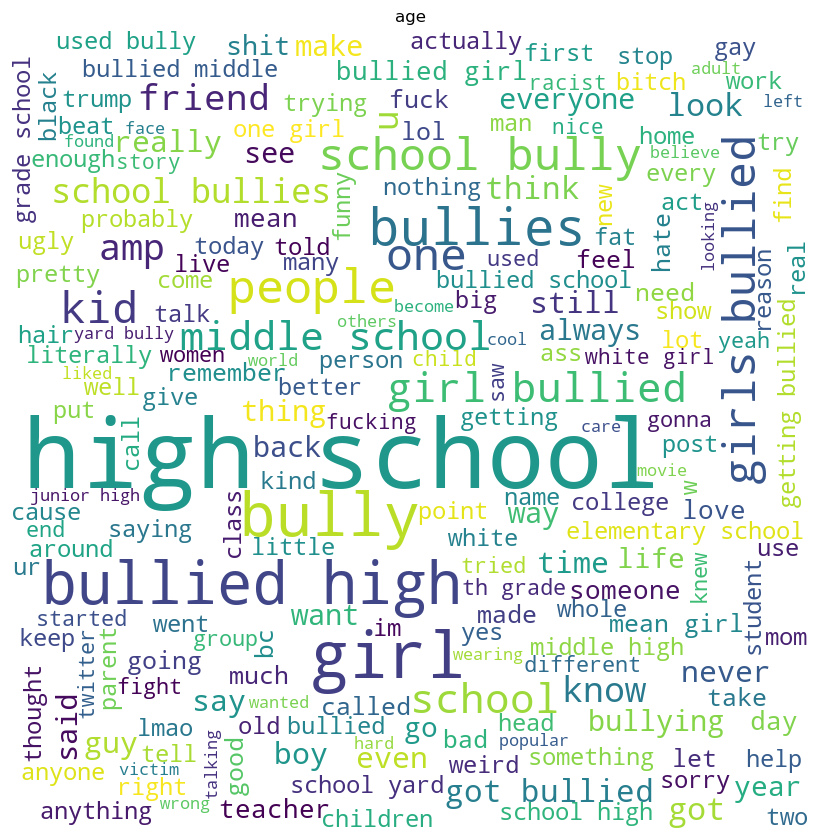

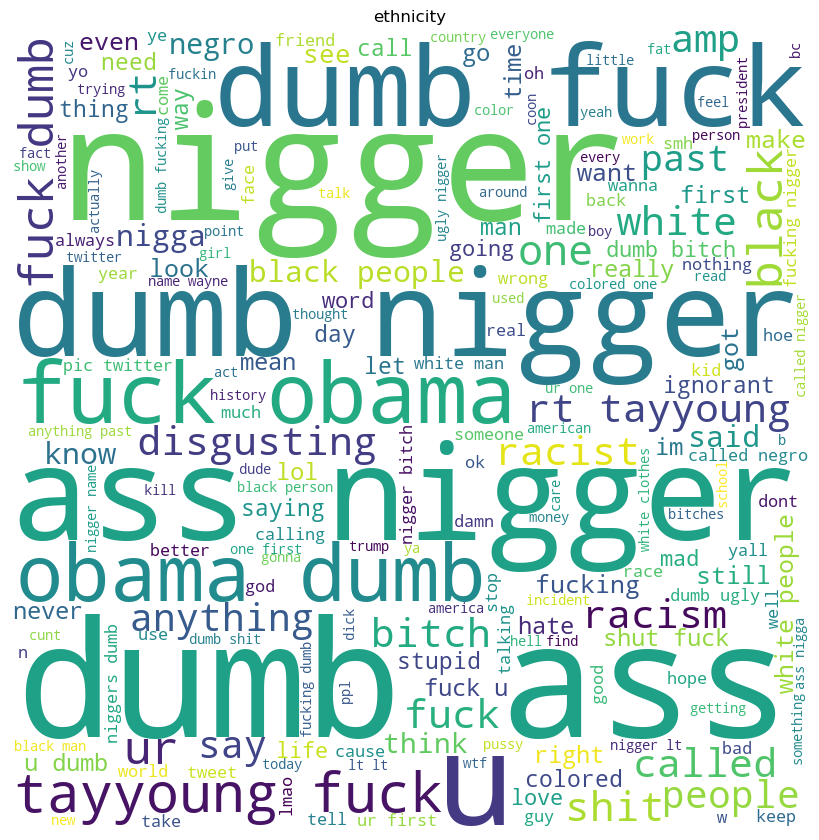

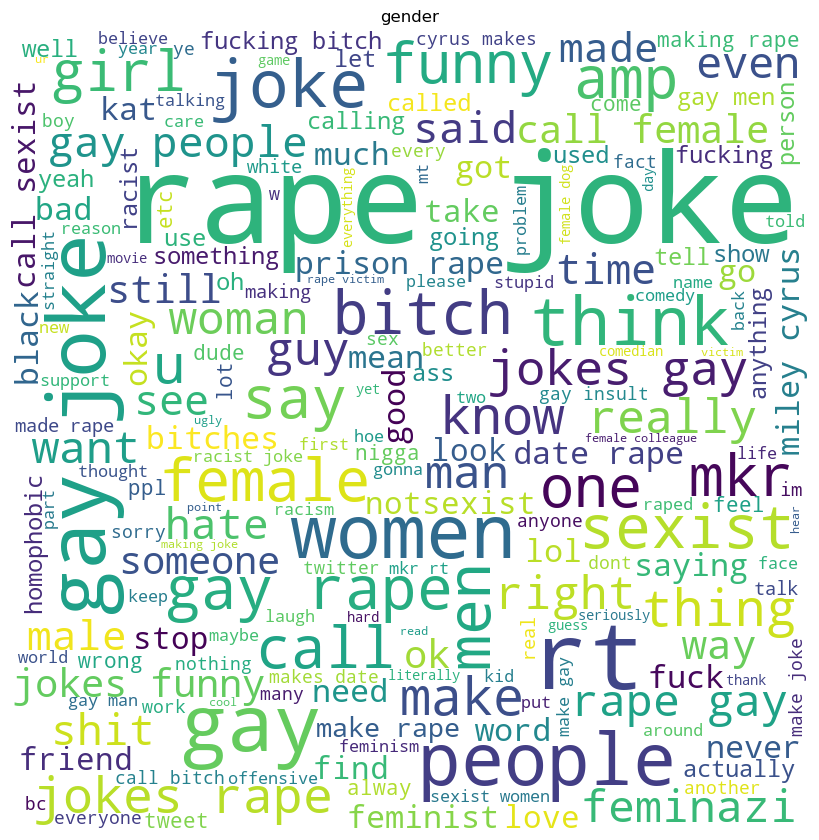

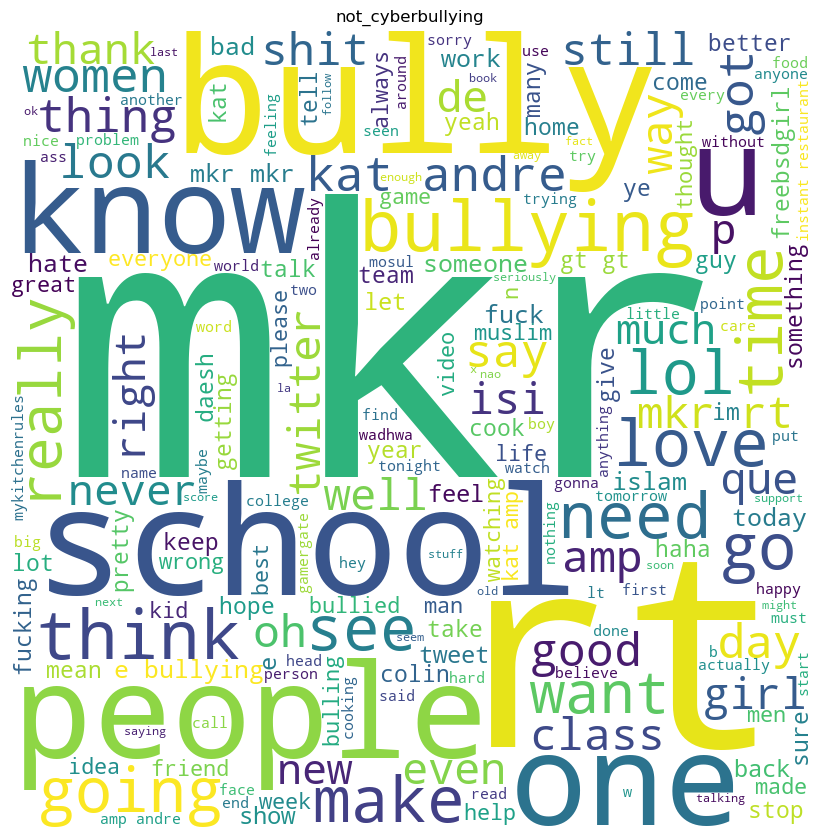

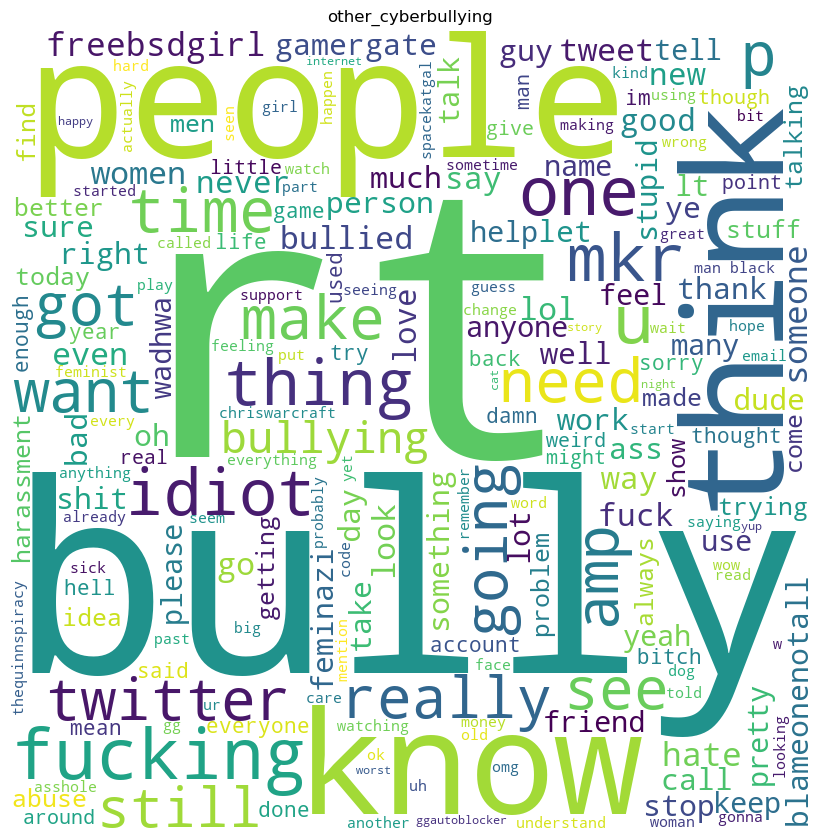

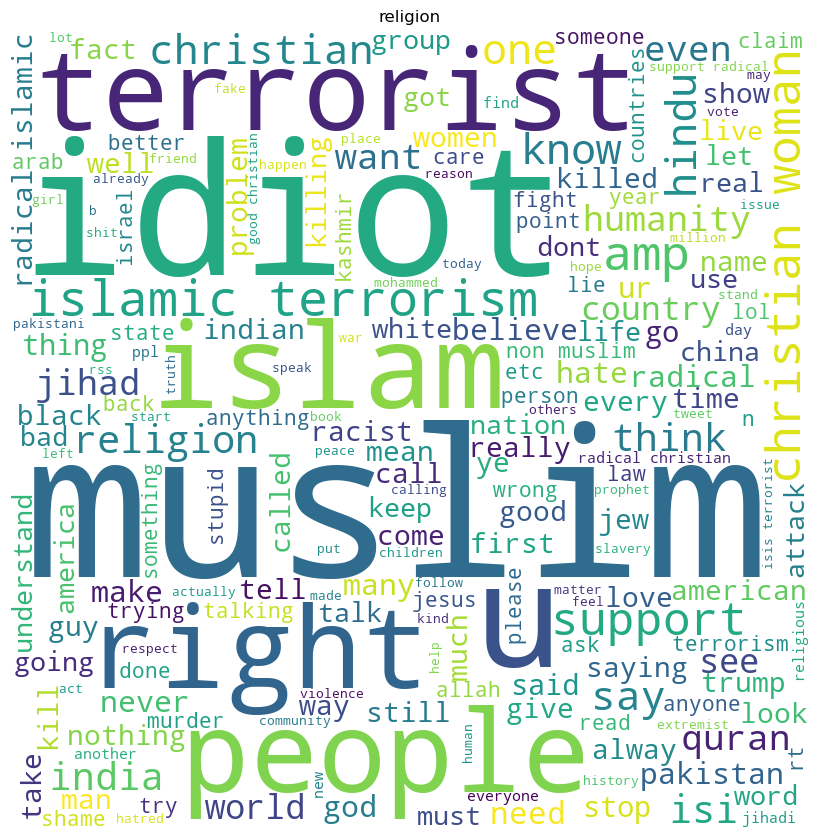

C:\Users\Shameer\AppData\Local\Temp\ipykernel_10572\977479243.py:121: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, Y_train)


Train Accuracy  : 95.87 %
Test Accuracy   : 80.77 %
Precision       : 80.94 %
Recall          : 81.19 %
Predicted Category: other_cyberbullying


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from autocorrect import Speller
import unidecode
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from nltk.corpus import stopwords
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay
import joblib
import nltk
nltk.download('stopwords')
# Load the data
data = pd.read_csv("cyberbullying_tweets.csv")

# Preprocessing functions
def case_convert():
    data.tweet_text = [i.lower() for i in data.tweet_text.values]

def remove_specials():
    data.tweet_text = [re.sub(r"[^a-zA-Z]", " ", text) for text in data.tweet_text.values]

def remove_shorthands():
    CONTRACTION_MAP = {
        # contraction mapping
    }
    texts = []
    for text in data.tweet_text.values:
        string = ""
        for word in text.split(" "):
            if word.strip() in list(CONTRACTION_MAP.keys()):
                string = string + " " + CONTRACTION_MAP[word]
            else:
                string = string + " " + word
        texts.append(string.strip())
    data.tweet_text = texts

def remove_stopwords():
    texts = []
    stopwords_list = stopwords.words('english')
    for item in data.tweet_text.values:
        string = ""
        for word in item.split(" "):
            if word.strip() in stopwords_list:
                continue
            else:
                string = string + " " + word
        texts.append(string)
    data.tweet_text = texts

def remove_links():
    texts = []
    for text in data.tweet_text.values:
        remove_https = re.sub(r'http\S+', '', text)
        remove_com = re.sub(r"\ [A-Za-z]*\.com", " ", remove_https)
        texts.append(remove_com)
    data.tweet_text = texts

def remove_accents():
    data.tweet_text = [unidecode.unidecode(text) for text in data.tweet_text.values]

def normalize_spaces():
    data.tweet_text = [re.sub(r"\s+", " ", text) for text in data.tweet_text.values]

# Apply preprocessing steps
case_convert()
remove_links()
remove_shorthands()
remove_accents()
remove_specials()
remove_stopwords()
normalize_spaces()

# Encode the target labels
lenc = LabelEncoder()
data.cyberbullying_type = lenc.fit_transform(data.cyberbullying_type)

# Visualize class balance
plt.figure(figsize=(15, 5))
un, count = np.unique(data.cyberbullying_type.values, return_counts=True)
plt.bar([lenc.classes_[int(i)] for i in un], count)
plt.xlabel("Class")
plt.ylabel("Count")
plt.title("Class Balance")
plt.show()

# Generate word cloud for each class
for c in range(len(lenc.classes_)):
    string = ""
    for i in data[data.cyberbullying_type == c].tweet_text.values:
        string = string + " " + i.strip()

    wordcloud = WordCloud(width=800, height=800,
                          background_color='white',
                          stopwords=set(STOPWORDS),
                          min_font_size=10).generate(string)

    # plot the WordCloud image
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.title(lenc.classes_[c])
    plt.show()
    del string

# Vectorize text data
vec = TfidfVectorizer(max_features=3000)
X_train, X_test, Y_train, Y_test = train_test_split(vec.fit_transform(data.tweet_text.values).toarray(),
                                                    data.cyberbullying_type.values.reshape(-1, 1),
                                                    test_size=0.2,
                                                    shuffle=True,
                                                    random_state=42)

# Train the model
model = RandomForestClassifier(n_estimators=10, random_state=42)
model.fit(X_train, Y_train)

# Print evaluation metrics
print("Train Accuracy  : {:.2f} %".format(accuracy_score(model.predict(X_train), Y_train) * 100))
print("Test Accuracy   : {:.2f} %".format(accuracy_score(model.predict(X_test), Y_test) * 100))
print("Precision       : {:.2f} %".format(precision_score(model.predict(X_test), Y_test, average='macro') * 100))
print("Recall          : {:.2f} %".format(recall_score(model.predict(X_test), Y_test, average='macro') * 100))

# Save the model
joblib.dump(model, "cyberbullying_model.pkl")
joblib.dump(vec, "vectorizer.pkl")
joblib.dump(lenc, "label_encoder.pkl")

# Function to classify text based on the trained model
def classify_text(text):
    preprocessed_text = vec.transform([text]).toarray()
    predicted_label = model.predict(preprocessed_text)
    return lenc.inverse_transform(predicted_label)[0]

# Example usage of the classify_text function
text = "This is a cyberbullying tweet"
predicted_category = classify_text(text)
print("Predicted Category:", predicted_category)


In [3]:
# Load the saved model
loaded_model = joblib.load("cyberbullying_model.pkl")

# Load the test data
test_data = pd.read_csv("cyberbullying_tweets.csv")

# Apply the same preprocessing steps to the test data
case_convert()
remove_links()
remove_shorthands()
remove_accents()
remove_specials()
remove_stopwords()
normalize_spaces()

# Transform the test data labels using the same LabelEncoder
test_data.cyberbullying_type = lenc.transform(test_data.cyberbullying_type)

# Vectorize the test data
X_test = vec.transform(test_data.tweet_text.values).toarray()
Y_test = test_data.cyberbullying_type.values.reshape(-1, 1)

# Predict the categories for the test data
predicted_labels = loaded_model.predict(X_test)

# Decode the predicted and actual labels
predicted_categories = lenc.inverse_transform(predicted_labels)
actual_categories = lenc.inverse_transform(Y_test)

# Compare predicted and actual categories
for i in range(len(predicted_categories)):
    print("Text:", test_data.tweet_text.values[i])
    print("Predicted Category:", predicted_categories[i])
    print("Actual Category:", actual_categories[i])
    print("------------------------------------")


c:\Users\Shameer\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:155: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Text: In other words #katandandre, your food was crapilicious! #mkr
Predicted Category: not_cyberbullying
Actual Category: not_cyberbullying
------------------------------------
Text: Why is #aussietv so white? #MKR #theblock #ImACelebrityAU #today #sunrise #studio10 #Neighbours #WonderlandTen #etc
Predicted Category: not_cyberbullying
Actual Category: not_cyberbullying
------------------------------------
Text: @XochitlSuckkks a classy whore? Or more red velvet cupcakes?
Predicted Category: not_cyberbullying
Actual Category: not_cyberbullying
------------------------------------
Text: @Jason_Gio meh. :P  thanks for the heads up, but not too concerned about another angry dude on twitter.
Predicted Category: not_cyberbullying
Actual Category: not_cyberbullying
------------------------------------
Text: @RudhoeEnglish This is an ISIS account pretending to be a Kurdish account.  Like Islam, it is all lies.
Predicted Category: religion
Actual Category: not_cyberbullying
-------------------